In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2' already exists and is not an empty directory.


In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("dataset_train", {}, "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/train/train.json", "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/train")
register_coco_instances("dataset_val", {}, "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/valid/valid.json", "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/valid")


In [7]:
train_metadata = MetadataCatalog.get("dataset_train")
train_dataset_dicts = DatasetCatalog.get("dataset_train")

[04/22 08:34:00 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/train/train.json takes 1.81 seconds.
WARNING [04/22 08:34:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/22 08:34:00 d2.data.datasets.coco]: Loaded 168 images in COCO format from /content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/train/train.json


In [8]:
val_metadata = MetadataCatalog.get("dataset_val")
val_dataset_dicts = DatasetCatalog.get("dataset_val")

WARNING [04/22 08:34:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/22 08:34:02 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/valid/valid.json


In [9]:
from matplotlib import pyplot as plt

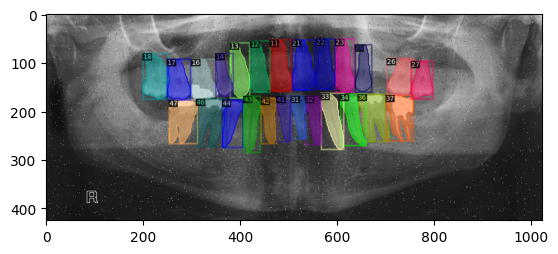

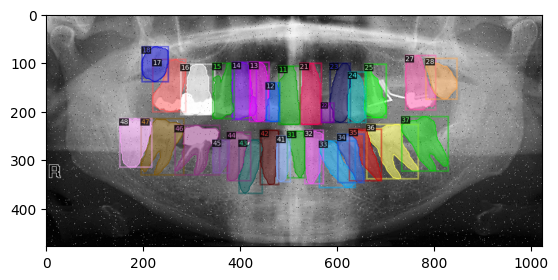

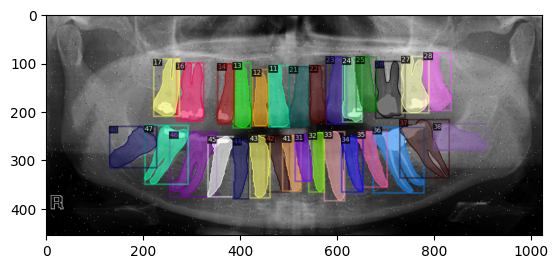

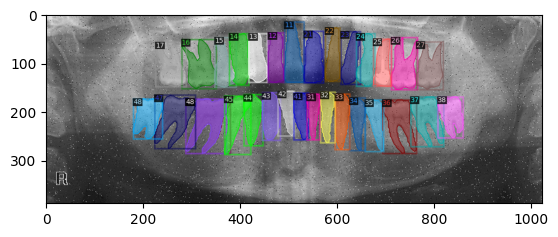

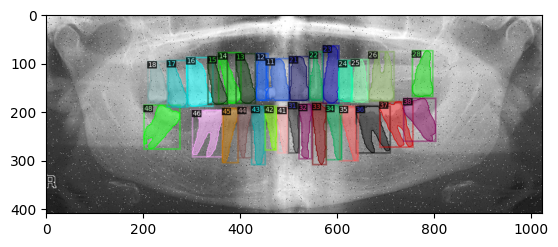

In [ ]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

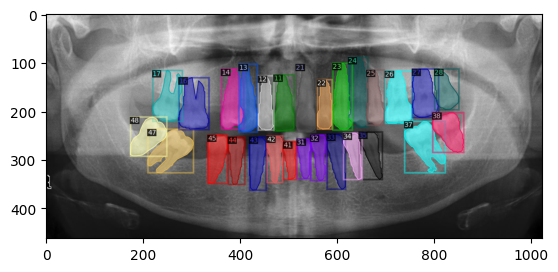

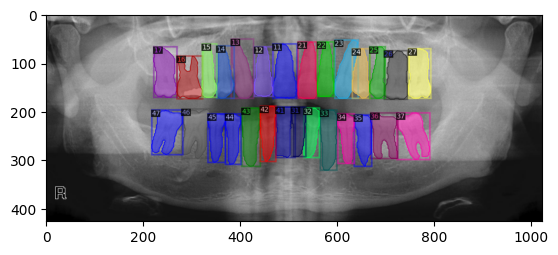

In [ ]:
# Visualize some random samples from validation dataset
for d in random.sample(val_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

In [12]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/Colab Notebooks/Detectron 2/results"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train")
cfg.DATASETS.TEST = ("dataset_val")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 5  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500    # 1500 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 32  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.


trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available


[04/22 08:37:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
trainer.train() #Start the training process

[04/22 05:33:43 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/22 05:34:25 d2.utils.events]:  eta: 0:46:13  iter: 19  total_loss: 7.143  loss_cls: 3.475  loss_box_reg: 0.7412  loss_mask: 0.6928  loss_rpn_cls: 1.972  loss_rpn_loc: 0.1953    time: 1.8919  last_time: 1.5973  data_time: 0.6793  last_data_time: 0.4550   lr: 4.9953e-06  max_mem: 5348M
[04/22 05:35:02 d2.utils.events]:  eta: 0:43:09  iter: 39  total_loss: 5.369  loss_cls: 3.384  loss_box_reg: 0.7985  loss_mask: 0.6926  loss_rpn_cls: 0.3144  loss_rpn_loc: 0.1778    time: 1.7833  last_time: 1.5692  data_time: 0.4021  last_data_time: 0.1354   lr: 9.9902e-06  max_mem: 5348M
[04/22 05:35:31 d2.utils.events]:  eta: 0:40:12  iter: 59  total_loss: 4.901  loss_cls: 3.156  loss_box_reg: 0.8351  loss_mask: 0.6923  loss_rpn_cls: 0.07244  loss_rpn_loc: 0.1586    time: 1.6775  last_time: 1.5511  data_time: 0.1642  last_data_time: 0.2110   lr: 1.4985e-05  max_mem: 5348M
[04/22 05:36:02 d2.utils.events]:  eta: 0:37:24  iter: 79  total_loss: 4.502  loss_cls: 2.754  loss_box_reg: 0.817  loss_mask: 0.6

In [13]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/Colab Notebooks/Detectron 2/results"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train")
cfg.DATASETS.TEST = ("dataset_val")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 5  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500    # 1500 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 32  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.


trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=True) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available


[04/22 08:38:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [14]:
trainer.train() #Start the training process

[04/22 08:38:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/22 08:39:05 d2.utils.events]:  eta: 0:42:05  iter: 19  total_loss: 7.319  loss_cls: 3.714  loss_box_reg: 0.7325  loss_mask: 0.6936  loss_rpn_cls: 1.99  loss_rpn_loc: 0.1953    time: 1.7508  last_time: 1.6791  data_time: 0.5840  last_data_time: 0.5783   lr: 4.9953e-06  max_mem: 5299M
[04/22 08:39:41 d2.utils.events]:  eta: 0:41:21  iter: 39  total_loss: 5.497  loss_cls: 3.575  loss_box_reg: 0.7905  loss_mask: 0.6935  loss_rpn_cls: 0.2662  loss_rpn_loc: 0.1715    time: 1.6703  last_time: 1.3577  data_time: 0.4026  last_data_time: 0.1686   lr: 9.9902e-06  max_mem: 5348M
[04/22 08:40:09 d2.utils.events]:  eta: 0:38:57  iter: 59  total_loss: 5.06  loss_cls: 3.31  loss_box_reg: 0.8249  loss_mask: 0.6932  loss_rpn_cls: 0.07327  loss_rpn_loc: 0.169    time: 1.5833  last_time: 1.5574  data_time: 0.1965  last_data_time: 0.2658   lr: 1.4985e-05  max_mem: 5348M
[04/22 08:40:37 d2.utils.events]:  eta: 0:35:30  iter: 79  total_loss: 4.572  loss_cls: 2.831  loss_box_reg: 0.8121  loss_mask: 0.6928

KeyError: "Dataset 'd' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, dataset_train, dataset_val"

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/Detectron 2/results" --port 6685

Output hidden; open in https://colab.research.google.com to view.

In [20]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/Colab Notebooks/Detectron 2/results/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

In [24]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[04/22 09:45:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/Colab Notebooks/Detectron 2/results/model_final.pth ...


In [25]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 5):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Output hidden; open in https://colab.research.google.com to view.

In [27]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[04/22 09:47:16 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/22 09:47:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/22 09:47:16 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/Colab Notebooks/Detectron 2/Dataset/valid/valid.json
[04/22 09:47:16 d2.data.build]: Distribution of instances among all 33 categories:
|   category    | #instances   | category   | #instances   | category   | #instances   |
|:-------------:|:-------------|:-----------|:-------------|:-----------|:-------------|
| tooth-tooth.. | 0            | 11         | 5            | 12         | 5            |
|      13       | 5            | 14         | 5            | 15         | 4            |
|      16       | 3            | 17         | 4            | 18         | 0            |
|      21       | 5            | 22         | 4            | 23      

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[04/22 09:47:19 d2.evaluation.evaluator]: Total inference time: 0:00:00.645570 (0.645570 s / iter per device, on 1 devices)
[04/22 09:47:19 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.121875 s / iter per device, on 1 devices)
[04/22 09:47:19 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/22 09:47:19 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/22 09:47:19 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.440
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.564
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.543
 Average

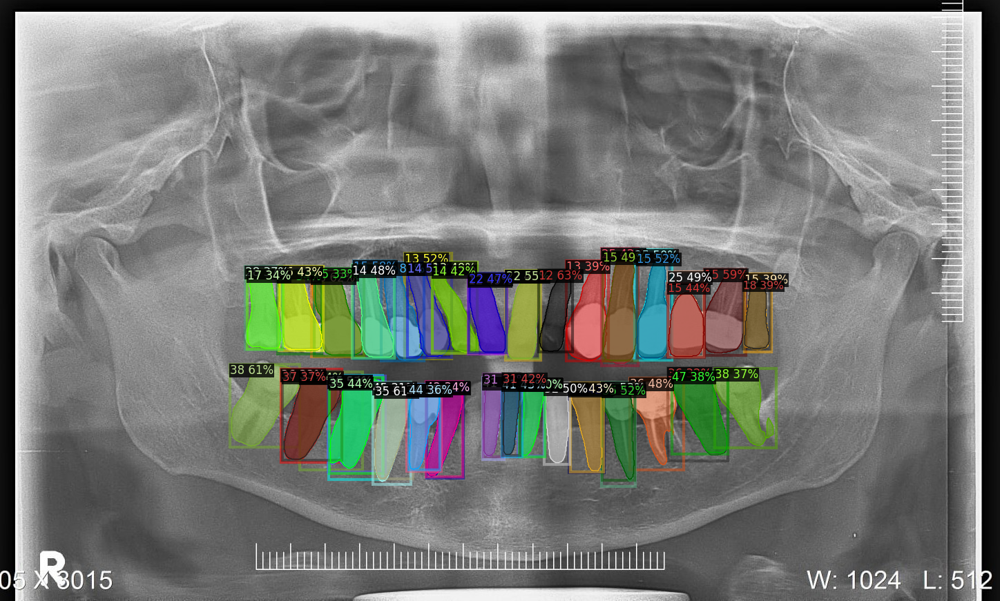

In [29]:
new_im = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Detectron 2/Test images/test1.jpg")
outputs  = predictor(new_im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(out.get_image()[:, :, ::-1])


In [28]:
# Directory path to the input images folder
input_images_directory = "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Test images"

# Output directory where the segmented images will be saved
output_directory = "/content/drive/MyDrive/Colab Notebooks/Detectron 2/Test Inference"  # Replace this with the path to your desired output directory

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

Segmentation of all images completed.
